In [1]:
import numpy as np
import pandas as pd
import timeit
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN

%alias_magic t timeit

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)


Created `%t` as an alias for `%timeit`.
Created `%%t` as an alias for `%%timeit`.


In [4]:
data = pd.read_csv(r'C:\Users\Saba\Documents\ML project\Full_particle_Data\particles_information.csv')
data.info()
data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19683000 entries, 0 to 19682999
Data columns (total 10 columns):
snapnum    int64
phkey      int64
x          float64
y          float64
z          float64
vx         float64
vy         float64
vz         float64
id         int64
In_halo    int64
dtypes: float64(6), int64(4)
memory usage: 1.5 GB


,snapnum,phkey,x,y,z,vx,vy,vz,id,In_halo
count,19683000.0,1.968300e+07,1.968300e+07,1.968300e+07,1.968300e+07,1.968300e+07,1.968300e+07,1.968300e+07,1.968300e+07,1.968300e+07
mean,0.0,1.637668e+04,3.127470e+01,3.124592e+01,3.122501e+01,-2.781189e-04,2.267425e-04,-4.716782e-05,9.841500e+06,2.833979e-01
std,0.0,9.453553e+03,1.804878e+01,1.804944e+01,1.802320e+01,2.414422e+02,2.154665e+02,2.888102e+02,5.681993e+06,4.506479e-01
min,0.0,0.000000e+00,5.066395e-07,0.000000e+00,3.213994e-06,-9.472481e+02,-1.023661e+03,-9.789142e+02,1.000000e+00,0.000000e+00
25%,0.0,8.202000e+03,1.564608e+01,1.561590e+01,1.563889e+01,-1.623357e+02,-1.451293e+02,-2.172641e+02,4.920751e+06,0.000000e+00
50%,0.0,1.635500e+04,3.130093e+01,3.123226e+01,3.119702e+01,6.388357e-01,3.100713e-01,-3.280887e+00,9.841500e+06,0.000000e+00
75%,0.0,2.455900e+04,4.690146e+01,4.689474e+01,4.681961e+01,1.639600e+02,1.479353e+02,2.112060e+02,1.476225e+07,1.000000e+00
max,0.0,3.276700e+04,6.250000e+01,6.250000e+01,6.250000e+01,8.930905e+02,9.109451e+02,1.070528e+03,1.968300e+07,1.000000e+00


In [5]:
d = data[['x', 'y', 'z', 'vx', 'vy' , 'vz' , 'id' , 'In_halo']]
d = np.array(d)
xl = max(d[:,0])/6 + 0.1
yl = max(d[:,1])/6 + 0.1
zl = max(d[:,2])/6 + 0.1
print(xl,yl,zl)

10.516666 10.516666 10.516666


In [6]:
box = {}
for i in range(6):
    for j in range(6):
        for k in range(6):
            print(36*i + 6*j + k)
            box[36*i + 6*j + k] = d[ d[:,0] > k*xl ]
            box[36*i + 6*j + k] = box[36*i + 6*j + k][ box[36*i + 6*j + k][:,0] < (k+1)*xl ]
            box[36*i + 6*j + k] = box[36*i + 6*j + k][ box[36*i + 6*j + k][:,1] > (j)*yl ]
            box[36*i + 6*j + k] = box[36*i + 6*j + k][ box[36*i + 6*j + k][:,1] < (j+1)*yl ]
            box[36*i + 6*j + k] = box[36*i + 6*j + k][ box[36*i + 6*j + k][:,2] > (i)*zl ]
            box[36*i + 6*j + k] = box[36*i + 6*j + k][ box[36*i + 6*j + k][:,2] < (i+1)*zl ]
            
            if i == 0:
                print(box[36*i + 6*j + k])

0
[[7.9177044e-02 3.3917315e-03 4.1671067e-01 ... 4.3663280e+01
  1.0000000e+00 0.0000000e+00]
 [2.8918898e-01 1.3027802e-01 4.5632730e-01 ... 3.5697285e+01
  2.0000000e+00 1.0000000e+00]
 [2.6269868e-01 1.9728065e-01 2.2456394e-01 ... 9.1230120e+01
  3.0000000e+00 0.0000000e+00]
 ...
 [3.9879605e-01 6.0212810e-01 8.3694460e-03 ... 1.4441193e+02
  1.9682984e+07 1.0000000e+00]
 [2.8571934e-01 1.0211190e-01 2.4742126e-02 ... 1.8953867e+02
  1.9682996e+07 0.0000000e+00]
 [5.2702278e-02 1.4002051e-02 2.0629883e-02 ... 2.1974171e+02
  1.9683000e+07 1.0000000e+00]]
1
[[ 1.06440710e+01  8.30566700e+00  2.34099750e-01 ... -1.00799225e+02
   7.69890000e+04  0.00000000e+00]
 [ 1.06405240e+01  8.73433600e+00  3.53945300e-01 ... -4.65129930e+01
   7.69920000e+04  0.00000000e+00]
 [ 1.05507350e+01  8.51683200e+00  8.69741500e-01 ... -7.66253700e+01
   7.69940000e+04  0.00000000e+00]
 ...
 [ 2.02855300e+01  5.96618650e-03  5.92419960e+00 ...  3.32912260e+02
   4.52346900e+06  0.00000000e+00]
 [ 2.00

[[3.1595160e+01 3.1325940e+01 3.7865078e-01 ... 4.1077942e+02
  4.9206710e+06 1.0000000e+00]
 [3.1731848e+01 3.1523489e+01 4.1955630e-01 ... 4.2474377e+02
  4.9206720e+06 1.0000000e+00]
 [3.1750029e+01 3.1421354e+01 1.8757260e-01 ... 4.0664910e+02
  4.9206750e+06 1.0000000e+00]
 ...
 [3.2782570e+01 3.1293362e+01 1.9664764e-02 ... 3.7211790e+02
  1.4761560e+07 1.0000000e+00]
 [3.2566975e+01 3.1388924e+01 2.1743774e-04 ... 3.6548163e+02
  1.4761561e+07 1.0000000e+00]
 [3.2325855e+01 3.1320484e+01 2.0572662e-02 ... 3.6285010e+02
  1.4761562e+07 1.0000000e+00]]
16
[[4.2084750e+01 3.1402640e+01 3.1732730e+00 ... 3.4860013e+02
  4.9630640e+06 1.0000000e+00]
 [4.2230175e+01 3.1292950e+01 3.0402710e+00 ... 4.1513818e+02
  4.9630650e+06 1.0000000e+00]
 [4.2429756e+01 3.1456745e+01 3.0111750e+00 ... 4.1204553e+02
  4.9630660e+06 1.0000000e+00]
 ...
 [4.3278248e+01 3.1252508e+01 4.2335510e-02 ... 6.1728143e+02
  1.4718924e+07 1.0000000e+00]
 [4.3199253e+01 3.1478683e+01 2.8697968e-02 ... 5.635974

[[9.2959180e-01 6.2469807e+01 4.5282304e-01 ... 7.8050720e+01
  3.1000000e+01 1.0000000e+00]
 [4.6014377e-01 6.2484665e+01 8.7648180e-01 ... 9.1456985e+01
  3.9000000e+01 1.0000000e+00]
 [3.0111778e-01 6.2494950e+01 7.0879257e-01 ... 7.7201800e+01
  6.9000000e+01 0.0000000e+00]
 ...
 [6.9702953e-01 5.4792244e+01 7.4005127e-04 ... 3.5295418e+01
  1.6876946e+07 0.0000000e+00]
 [7.5750694e+00 5.4436996e+01 2.2888184e-03 ... 4.6496860e+01
  1.6891997e+07 0.0000000e+00]
 [7.3193455e+00 5.4411680e+01 1.3237000e-03 ... 6.9711205e+01
  1.6892002e+07 0.0000000e+00]]
31
[[ 1.5554430e+01  6.2489310e+01  3.5415888e+00 ... -2.8871570e+01
   1.2122300e+05  0.0000000e+00]
 [ 1.1793004e+01  6.2489655e+01  3.4912870e+00 ... -2.3685255e+01
   1.2259900e+05  0.0000000e+00]
 [ 1.1941210e+01  6.2496914e+01  3.2955067e+00 ... -8.7101370e+01
   1.2260400e+05  0.0000000e+00]
 ...
 [ 2.0990683e+01  5.4871647e+01  7.1130264e-01 ...  1.7819344e+01
   4.5355790e+06  0.0000000e+00]
 [ 2.0994596e+01  5.4910282e+01 

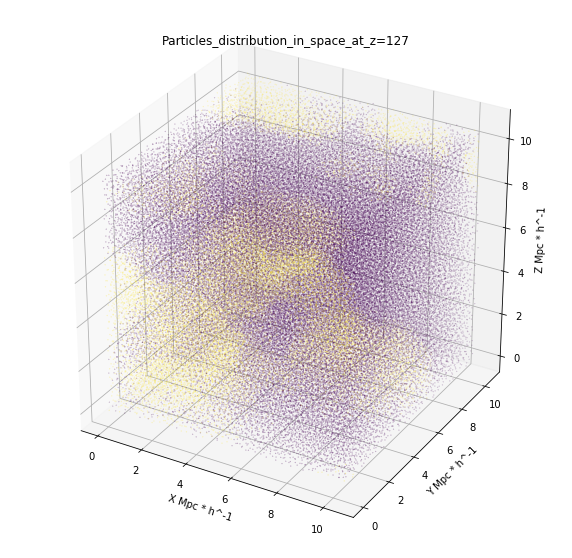

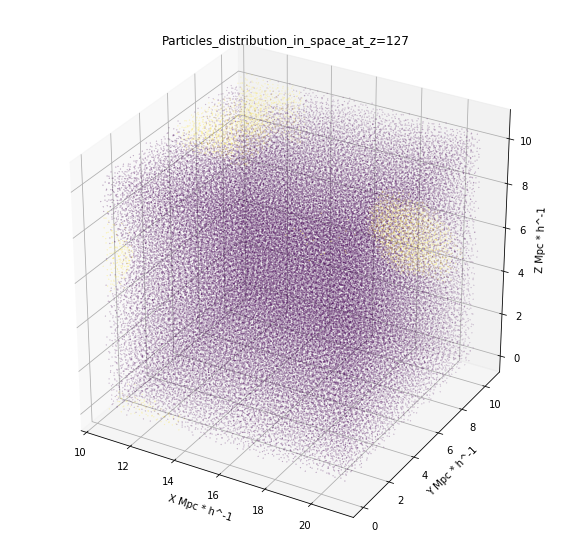

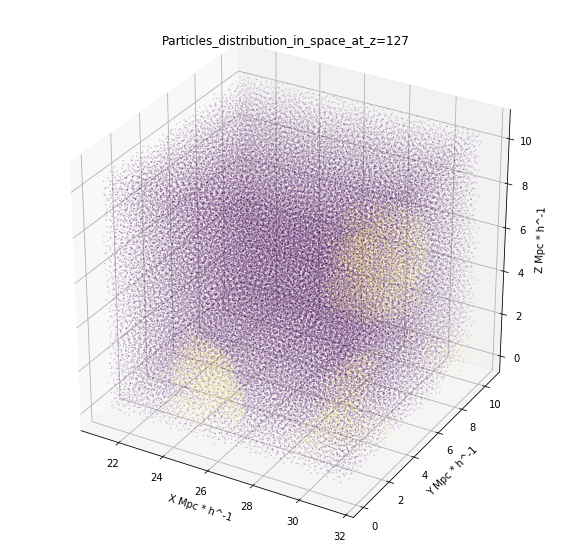

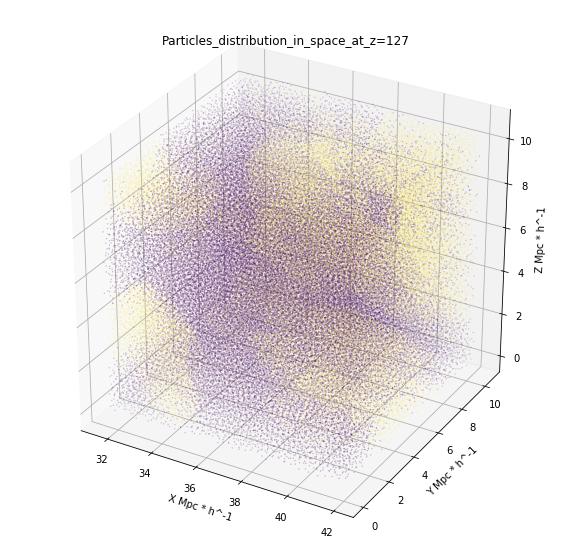

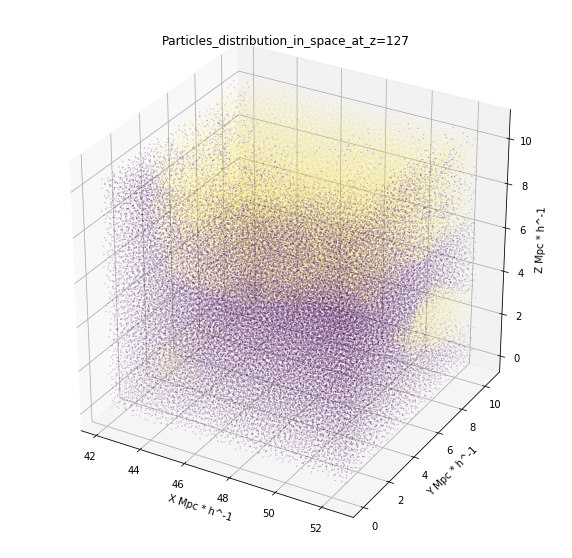

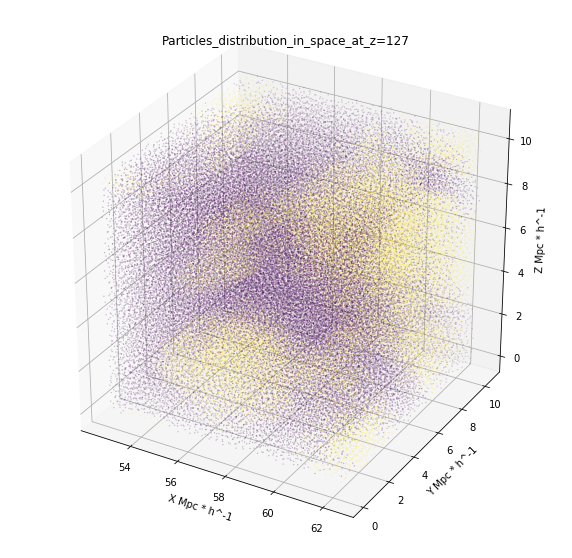

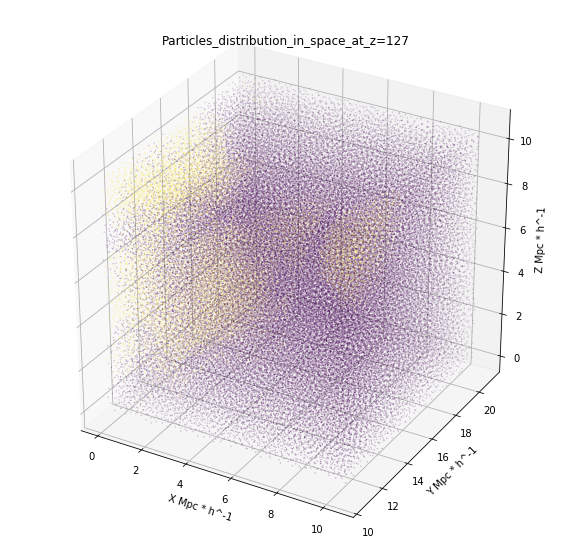

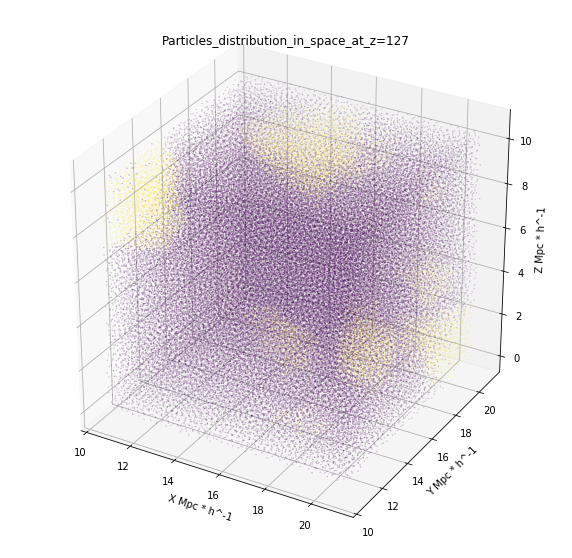

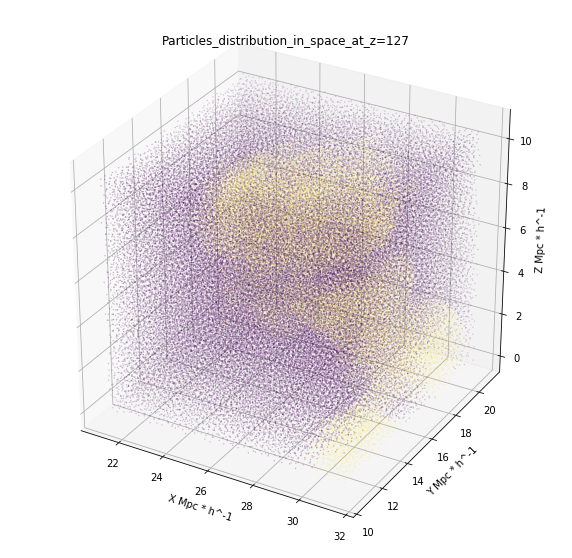

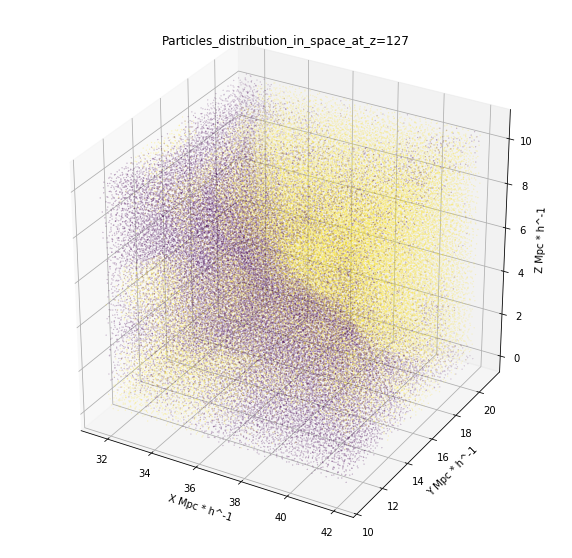

In [27]:
for i in range(10):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')

    # load some test data for demonstration and plotting
    title = 'Particles_distribution_in_space_at_z=127'
    ax.set_title(title)
    ax.scatter(box[i][:,0], box[i][:,1], box[i][:,2], s = 0.03, c= box[i][:,-1] , cmap= 'viridis')
    ax.set_xlabel('X Mpc * h^-1')
    ax.set_ylabel('Y Mpc * h^-1')
    ax.set_zlabel('Z Mpc * h^-1')
    plt.show()

In [16]:
density = 1600
r = 1.66

for i in range(216):
    print('box' , i)
    
    clustering = DBSCAN(eps= r , min_samples=density).fit(box[i][:,:3])
    labels = clustering.labels_
    
    if i==0:
        cm_ids = box[i][clustering.core_sample_indices_, -2]
        components= clustering.components_ 
    else:
        components = np.append(components, clustering.components_ , axis = 0)  
        cm_ids = np.append(cm_ids, box[i][clustering.core_sample_indices_, -2])
    print('number of cm:',len(components) , '--' , len(cm_ids))
    print('CM ids: ', cm_ids)
    print('size of the box:' ,len(labels))
    print('number of noises:',len(labels[labels == -1]))
    in_halo_pred = np.where(labels == -1 , 0, 1)
    c = np.insert(box[i], -1 , in_halo_pred, axis = 1)
    # last column is the real in_halos and one to the last is the noise indexes
    
    noise = c[c[:,-2] == 0]
    print(len(noise))
    true_noise = noise[noise[:,-1] == 0]
    false_noise = noise[noise[:,-1] == 1]
    print('true prediction for out halos:' , len(true_noise))
    print('false prediction for out halos:' , len(false_noise))
    print('predicted out halos:' , len(c[c[:,-2] == 0]))
    print('predicted in halos:' , len(c[c[:,-2] == 1]))
    print('real out halos:' , len(c[c[:,-1] == 0]))
    print('real in halos:' , len(c[c[:,-1] == 1]))
    #print('Error in out halo:', len(false_noise)/len(true_noise)*100 , '%' )
    print('Total error in out halo:', len(false_noise)/len(c)*100 , '%' )
    print('-------------------')
    box[i] = c

box 0
number of cm: 407 -- 407
CM ids:  [  363.   919.   921.   923.   927.   928.   930.   932.   933.   934.
   936.   939.   941.   947.  1340.  1341.  1342.  1344.  1345.  1356.
  1360.  1365.  1366.  1369.  1370.  1371.  1373.  1374.  1375.  1376.
  1377.  1392.  1439.  1441.  1538.  1542.  1551.  2090.  2681.  3111.
  3112.  3117.  3218.  3222.  3223.  3228.  3273.  3274.  3282.  3284.
  3286.  3287.  3290.  3293.  3294.  3295.  3296.  3299.  3300.  3302.
  3303.  3304.  3306.  3321.  3324.  3328.  3360.  3742.  3743.  3747.
  3750.  3751.  3752.  3754.  3756.  3757.  3760.  3761.  3764.  3769.
  3771.  3774.  3775.  3786.  4324.  4337.  4342. 17170. 17171. 27366.
 27375. 27377. 27382. 27386. 27388. 27951. 27955. 27957. 27958. 27961.
 27963. 27966. 27979. 27980. 27981. 27982. 27984. 27985. 27986. 27987.
 27990. 27991. 27992. 27993. 27997. 27999. 28000. 28001. 28004. 28005.
 28006. 28007. 28008. 28009. 28010. 28011. 28013. 28014. 28015. 28016.
 28018. 28023. 28026. 28027. 28028. 2

number of cm: 1828 -- 1828
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 8.272362e+06 8.272374e+06
 8.272409e+06]
size of the box: 94342
number of noises: 64225
64225
true prediction for out halos: 51006
false prediction for out halos: 13219
predicted out halos: 64225
predicted in halos: 30117
real out halos: 66094
real in halos: 28248
Total error in out halo: 14.011786902970044 %
-------------------
box 4
number of cm: 4658 -- 4658
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 8.128204e+06 8.128416e+06
 8.128417e+06]
size of the box: 93984
number of noises: 59226
59226
true prediction for out halos: 47214
false prediction for out halos: 12012
predicted out halos: 59226
predicted in halos: 34758
real out halos: 59483
real in halos: 34501
Total error in out halo: 12.780898876404494 %
-------------------
box 5
number of cm: 6763 -- 6763
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 7.769505e+06 7.822633e+06
 7.822635e+06]
size of the box: 88610
number of noises: 6047

number of cm: 41402 -- 41402
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 7.377939e+06 7.377940e+06
 7.377953e+06]
size of the box: 88959
number of noises: 57681
57681
true prediction for out halos: 45994
false prediction for out halos: 11687
predicted out halos: 57681
predicted in halos: 31278
real out halos: 56420
real in halos: 32539
Total error in out halo: 13.13751278678942 %
-------------------
box 24
number of cm: 41528 -- 41528
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 3.063744e+06 3.063755e+06
 3.063756e+06]
size of the box: 93799
number of noises: 83744
83744
true prediction for out halos: 60334
false prediction for out halos: 23410
predicted out halos: 83744
predicted in halos: 10055
real out halos: 63681
real in halos: 30118
Total error in out halo: 24.957622149489865 %
-------------------
box 25
number of cm: 41560 -- 41560
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 4.469092e+06 4.469430e+06
 4.698529e+06]
size of the box: 92756
number of noise

number of cm: 65085 -- 65085
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 2.259503e+06 2.259517e+06
 2.259519e+06]
size of the box: 93335
number of noises: 72798
72798
true prediction for out halos: 64440
false prediction for out halos: 8358
predicted out halos: 72798
predicted in halos: 20537
real out halos: 71992
real in halos: 21343
Total error in out halo: 8.954840092141211 %
-------------------
box 44
number of cm: 66933 -- 66933
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 1.686065e+06 1.686071e+06
 1.688044e+06]
size of the box: 93976
number of noises: 64498
64498
true prediction for out halos: 55635
false prediction for out halos: 8863
predicted out halos: 64498
predicted in halos: 29478
real out halos: 66189
real in halos: 27787
Total error in out halo: 9.431131352685792 %
-------------------
box 45
number of cm: 73043 -- 73043
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 9.081371e+06 9.081380e+06
 9.081402e+06]
size of the box: 95034
number of noises: 

number of cm: 122245 -- 122245
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 6.006343e+06 6.006347e+06
 6.006530e+06]
size of the box: 93510
number of noises: 76114
76114
true prediction for out halos: 65357
false prediction for out halos: 10757
predicted out halos: 76114
predicted in halos: 17396
real out halos: 70372
real in halos: 23138
Total error in out halo: 11.503582504544967 %
-------------------
box 64
number of cm: 125019 -- 125019
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 7.184670e+06 7.184756e+06
 7.184766e+06]
size of the box: 94313
number of noises: 60358
60358
true prediction for out halos: 46082
false prediction for out halos: 14276
predicted out halos: 60358
predicted in halos: 33955
real out halos: 58372
real in halos: 35941
Total error in out halo: 15.136831613881437 %
-------------------
box 65
number of cm: 125688 -- 125688
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 7.193598e+06 7.194545e+06
 7.196275e+06]
size of the box: 88525
number o

number of cm: 181098 -- 181098
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 9.668254e+06 9.668256e+06
 9.668258e+06]
size of the box: 89884
number of noises: 28417
28417
true prediction for out halos: 17524
false prediction for out halos: 10893
predicted out halos: 28417
predicted in halos: 61467
real out halos: 28999
real in halos: 60885
Total error in out halo: 12.118953317609362 %
-------------------
box 84
number of cm: 182385 -- 182385
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 2.123917e+06 2.124249e+06
 2.124328e+06]
size of the box: 94099
number of noises: 66303
66303
true prediction for out halos: 58201
false prediction for out halos: 8102
predicted out halos: 66303
predicted in halos: 27796
real out halos: 71346
real in halos: 22753
Total error in out halo: 8.610080872272817 %
-------------------
box 85
number of cm: 182724 -- 182724
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 1.868375e+06 1.868707e+06
 1.868713e+06]
size of the box: 93989
number of 

number of cm: 215732 -- 215732
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 4.204396e+06 4.204400e+06
 4.204405e+06]
size of the box: 87822
number of noises: 79063
79063
true prediction for out halos: 67064
false prediction for out halos: 11999
predicted out halos: 79063
predicted in halos: 8759
real out halos: 71519
real in halos: 16303
Total error in out halo: 13.662863519391497 %
-------------------
box 104
number of cm: 220573 -- 220573
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 4.280864e+06 4.280868e+06
 4.280869e+06]
size of the box: 90205
number of noises: 28861
28861
true prediction for out halos: 13458
false prediction for out halos: 15403
predicted out halos: 28861
predicted in halos: 61344
real out halos: 26166
real in halos: 64039
Total error in out halo: 17.075550135801784 %
-------------------
box 105
number of cm: 222183 -- 222183
CM ids:  [3.630000e+02 9.190000e+02 9.210000e+02 ... 5.815379e+06 5.815405e+06
 5.815415e+06]
size of the box: 89498
number 

number of cm: 262990 -- 262990
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.1022139e+07 1.1022144e+07
 1.1022154e+07]
size of the box: 92900
number of noises: 81619
81619
true prediction for out halos: 72415
false prediction for out halos: 9204
predicted out halos: 81619
predicted in halos: 11281
real out halos: 75912
real in halos: 16988
Total error in out halo: 9.907427341227127 %
-------------------
box 124
number of cm: 268952 -- 268952
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.0918235e+07 1.0918237e+07
 1.0918267e+07]
size of the box: 94235
number of noises: 54747
54747
true prediction for out halos: 45956
false prediction for out halos: 8791
predicted out halos: 54747
predicted in halos: 39488
real out halos: 57898
real in halos: 36337
Total error in out halo: 9.328805645460816 %
-------------------
box 125
number of cm: 269002 -- 269002
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.0057333e+07 1.0057342e+07
 1.0118760e+07]
size of the box

number of cm: 295862 -- 295862
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.3172529e+07 1.3172609e+07
 1.3172611e+07]
size of the box: 83298
number of noises: 69784
69784
true prediction for out halos: 63648
false prediction for out halos: 6136
predicted out halos: 69784
predicted in halos: 13514
real out halos: 73867
real in halos: 9431
Total error in out halo: 7.366323321088142 %
-------------------
box 144
number of cm: 299446 -- 299446
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.9451888e+07 1.9510759e+07
 1.9517465e+07]
size of the box: 94525
number of noises: 47759
47759
true prediction for out halos: 37910
false prediction for out halos: 9849
predicted out halos: 47759
predicted in halos: 46766
real out halos: 50019
real in halos: 44506
Total error in out halo: 10.41946574980164 %
-------------------
box 145
number of cm: 299524 -- 299524
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.9501105e+07 1.9501106e+07
 1.9501110e+07]
size of the box:

number of cm: 315507 -- 315507
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.7121511e+07 1.7121519e+07
 1.7121531e+07]
size of the box: 93040
number of noises: 74551
74551
true prediction for out halos: 67542
false prediction for out halos: 7009
predicted out halos: 74551
predicted in halos: 18489
real out halos: 79554
real in halos: 13486
Total error in out halo: 7.533319002579536 %
-------------------
box 164
number of cm: 316909 -- 316909
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.5841212e+07 1.5841213e+07
 1.5841223e+07]
size of the box: 94490
number of noises: 59019
59019
true prediction for out halos: 46172
false prediction for out halos: 12847
predicted out halos: 59019
predicted in halos: 35471
real out halos: 58927
real in halos: 35563
Total error in out halo: 13.59614774050164 %
-------------------
box 165
number of cm: 317001 -- 317001
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.3684848e+07 1.3684854e+07
 1.4554530e+07]
size of the bo

number of cm: 343302 -- 343302
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.1659886e+07 1.1659887e+07
 1.1663006e+07]
size of the box: 88486
number of noises: 60690
60690
true prediction for out halos: 54112
false prediction for out halos: 6578
predicted out halos: 60690
predicted in halos: 27796
real out halos: 66345
real in halos: 22141
Total error in out halo: 7.433944352778971 %
-------------------
box 184
number of cm: 343408 -- 343408
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.1759385e+07 1.1759387e+07
 1.1769882e+07]
size of the box: 87641
number of noises: 79702
79702
true prediction for out halos: 74703
false prediction for out halos: 4999
predicted out halos: 79702
predicted in halos: 7939
real out halos: 78629
real in halos: 9012
Total error in out halo: 5.703951346972307 %
-------------------
box 185
number of cm: 343663 -- 343663
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.1970543e+07 1.1970642e+07
 1.1970643e+07]
size of the box: 

number of cm: 367125 -- 367125
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.2600773e+07 1.2600774e+07
 1.2600778e+07]
size of the box: 82845
number of noises: 71383
71383
true prediction for out halos: 68061
false prediction for out halos: 3322
predicted out halos: 71383
predicted in halos: 11462
real out halos: 73202
real in halos: 9643
Total error in out halo: 4.00989800229344 %
-------------------
box 204
number of cm: 368934 -- 368934
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.6954310e+07 1.6954311e+07
 1.6954312e+07]
size of the box: 89004
number of noises: 72378
72378
true prediction for out halos: 58672
false prediction for out halos: 13706
predicted out halos: 72378
predicted in halos: 16626
real out halos: 62909
real in halos: 26095
Total error in out halo: 15.399307896274324 %
-------------------
box 205
number of cm: 369664 -- 369664
CM ids:  [3.6300000e+02 9.1900000e+02 9.2100000e+02 ... 1.6985847e+07 1.6986720e+07
 1.7001440e+07]
size of the box

In [17]:
all_boxes = box[0]
for i in range(1, 216):
    all_boxes = np.append(all_boxes, box[i], axis = 0 )
print(all_boxes)

[[7.9177044e-02 3.3917315e-03 4.1671067e-01 ... 1.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [2.8918898e-01 1.3027802e-01 4.5632730e-01 ... 2.0000000e+00
  0.0000000e+00 1.0000000e+00]
 [2.6269868e-01 1.9728065e-01 2.2456394e-01 ... 3.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [6.2498955e+01 5.3959934e+01 5.5001926e+01 ... 1.6882392e+07
  0.0000000e+00 1.0000000e+00]
 [6.2492580e+01 5.3825770e+01 5.5482480e+01 ... 1.6882394e+07
  0.0000000e+00 1.0000000e+00]
 [6.2489296e+01 5.2791428e+01 5.6275340e+01 ... 1.6882887e+07
  0.0000000e+00 1.0000000e+00]]


In [24]:
color = {}
for i in range(216):
    par = box[i]
    c = np.zeros(len(box[i]))
    
    for j in range(len(box[i])):
        #noise
        if par[:,-2][j] == 0:
            # OUT halo noise
            if par[:,-1][j] == 0:
                c[j] = 0
            # IN halo noise
            else:
                c[j] = 1
        #no noise
        else:
            # OUT halo signal
            if par[:,-1][j] == 0:
                c[j] = 0.5
            #IN halo signal
            else:
                c[j] = 2
    color[i] = c
    
    print('OUT Box', i , ':', len(c[c == 0]))

    print('OUT predicted wrong Box', i ,':', len(c[c == 0.5]))

    print('IN boundary Box', i ,':', len(c[c == 1]))

    print('IN Box', i ,':', len(c[c == 2]))
    
    print('-----------')

 

OUT Box 0 : 63449
OUT predicted wrong Box 0 : 7542
IN boundary Box 0 : 12700
IN Box 0 : 10117
-----------
OUT Box 1 : 88373
OUT predicted wrong Box 1 : 0
IN boundary Box 1 : 3348
IN Box 1 : 0
-----------
OUT Box 2 : 82897
OUT predicted wrong Box 2 : 3748
IN boundary Box 2 : 3498
IN Box 2 : 2302
-----------
OUT Box 3 : 51006
OUT predicted wrong Box 3 : 15088
IN boundary Box 3 : 13219
IN Box 3 : 15029
-----------
OUT Box 4 : 47214
OUT predicted wrong Box 4 : 12269
IN boundary Box 4 : 12012
IN Box 4 : 22489
-----------
OUT Box 5 : 50446
OUT predicted wrong Box 5 : 9685
IN boundary Box 5 : 10032
IN Box 5 : 18447
-----------
OUT Box 6 : 77164
OUT predicted wrong Box 6 : 3225
IN boundary Box 6 : 7910
IN Box 6 : 4165
-----------
OUT Box 7 : 83659
OUT predicted wrong Box 7 : 834
IN boundary Box 7 : 7133
IN Box 7 : 1048
-----------
OUT Box 8 : 62628
OUT predicted wrong Box 8 : 11156
IN boundary Box 8 : 6544
IN Box 8 : 13372
-----------
OUT Box 9 : 33839
OUT predicted wrong Box 9 : 10753
IN boun

OUT Box 76 : 64472
OUT predicted wrong Box 76 : 7810
IN boundary Box 76 : 10437
IN Box 76 : 10640
-----------
OUT Box 77 : 26826
OUT predicted wrong Box 77 : 15807
IN boundary Box 77 : 10359
IN Box 77 : 36543
-----------
OUT Box 78 : 47409
OUT predicted wrong Box 78 : 12510
IN boundary Box 78 : 14735
IN Box 78 : 19524
-----------
OUT Box 79 : 70720
OUT predicted wrong Box 79 : 9249
IN boundary Box 79 : 7028
IN Box 79 : 6866
-----------
OUT Box 80 : 39178
OUT predicted wrong Box 80 : 7853
IN boundary Box 80 : 17037
IN Box 80 : 30416
-----------
OUT Box 81 : 28118
OUT predicted wrong Box 81 : 17429
IN boundary Box 81 : 15096
IN Box 81 : 34433
-----------
OUT Box 82 : 40930
OUT predicted wrong Box 82 : 14442
IN boundary Box 82 : 12113
IN Box 82 : 27148
-----------
OUT Box 83 : 17524
OUT predicted wrong Box 83 : 11475
IN boundary Box 83 : 10893
IN Box 83 : 49992
-----------
OUT Box 84 : 58201
OUT predicted wrong Box 84 : 13145
IN boundary Box 84 : 8102
IN Box 84 : 14651
-----------
OUT Box

OUT Box 151 : 73345
OUT predicted wrong Box 151 : 4128
IN boundary Box 151 : 8497
IN Box 151 : 7368
-----------
OUT Box 152 : 69278
OUT predicted wrong Box 152 : 6831
IN boundary Box 152 : 4332
IN Box 152 : 12947
-----------
OUT Box 153 : 73539
OUT predicted wrong Box 153 : 5165
IN boundary Box 153 : 5041
IN Box 153 : 8744
-----------
OUT Box 154 : 67609
OUT predicted wrong Box 154 : 8662
IN boundary Box 154 : 8317
IN Box 154 : 9060
-----------
OUT Box 155 : 67313
OUT predicted wrong Box 155 : 3581
IN boundary Box 155 : 16258
IN Box 155 : 1218
-----------
OUT Box 156 : 72974
OUT predicted wrong Box 156 : 5764
IN boundary Box 156 : 7090
IN Box 156 : 7017
-----------
OUT Box 157 : 82204
OUT predicted wrong Box 157 : 2067
IN boundary Box 157 : 4319
IN Box 157 : 3871
-----------
OUT Box 158 : 50681
OUT predicted wrong Box 158 : 11268
IN boundary Box 158 : 10931
IN Box 158 : 21268
-----------
OUT Box 159 : 65567
OUT predicted wrong Box 159 : 9383
IN boundary Box 159 : 4109
IN Box 159 : 1380

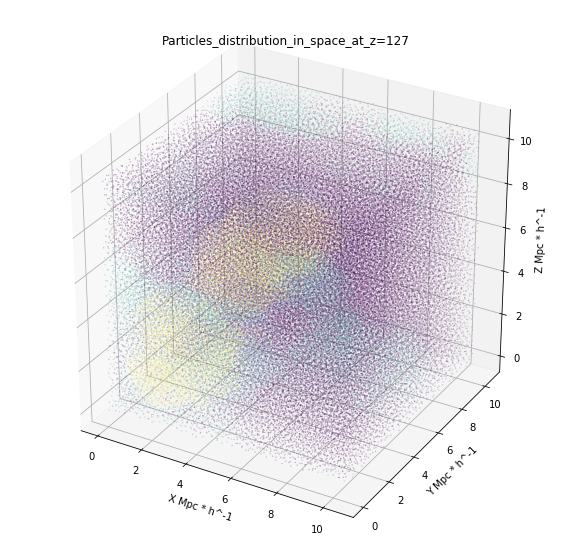

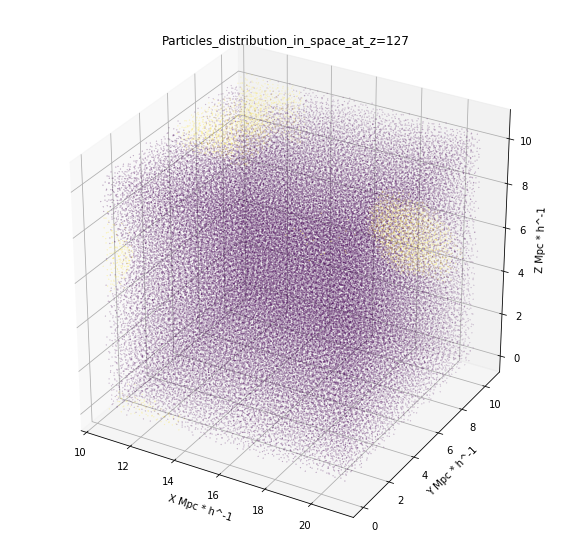

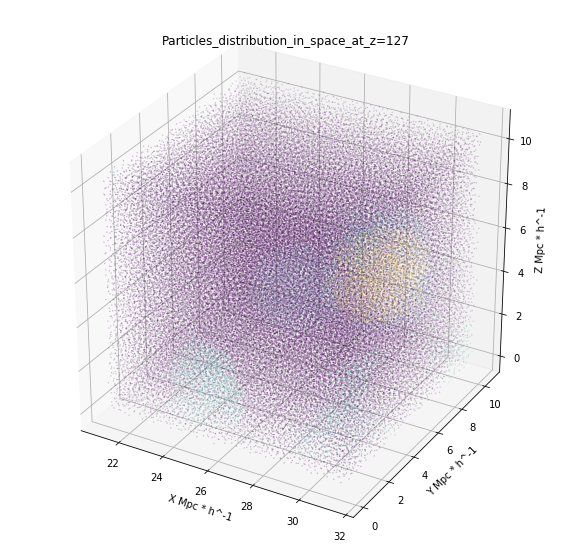

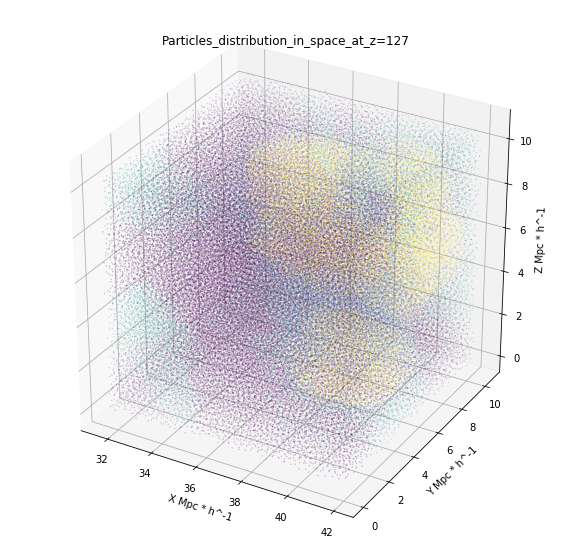

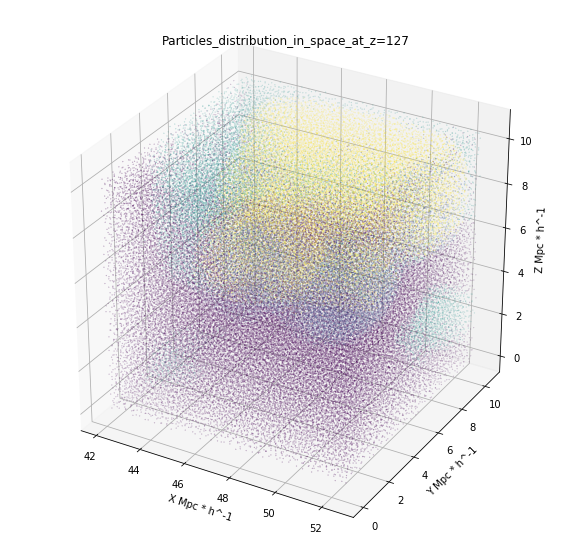

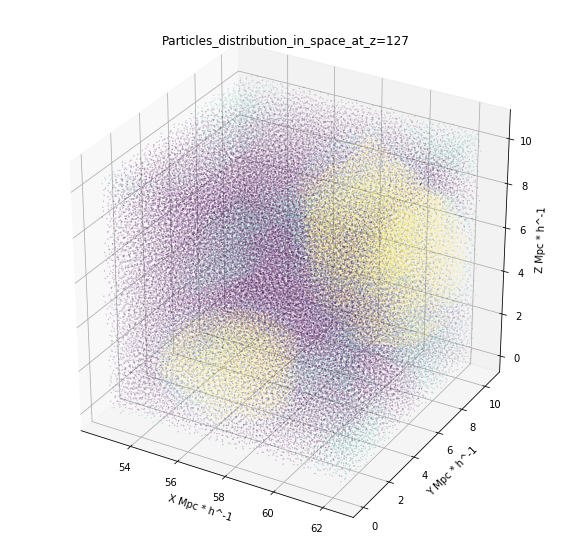

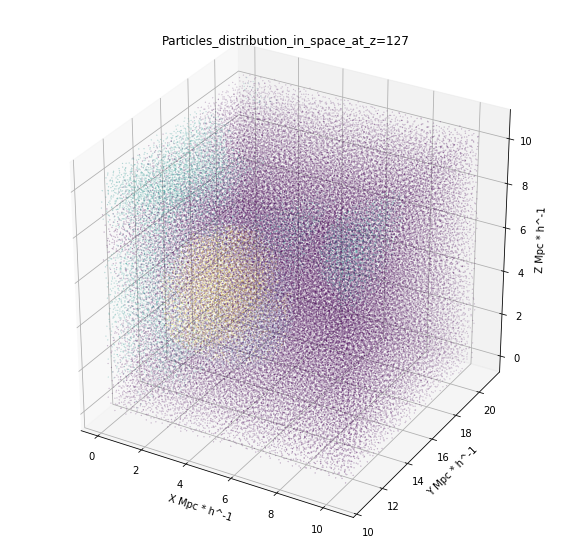

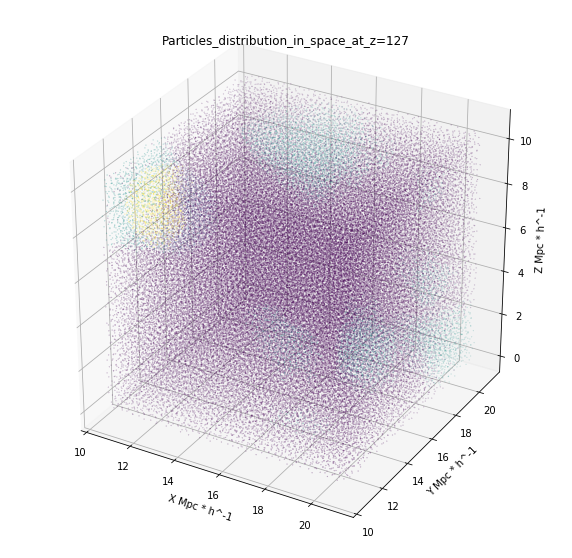

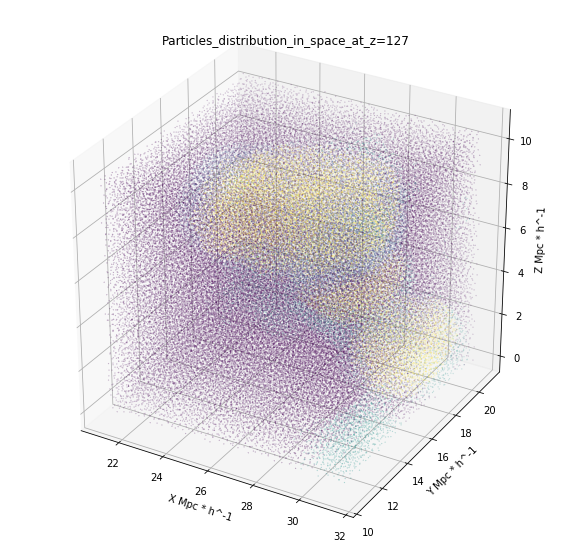

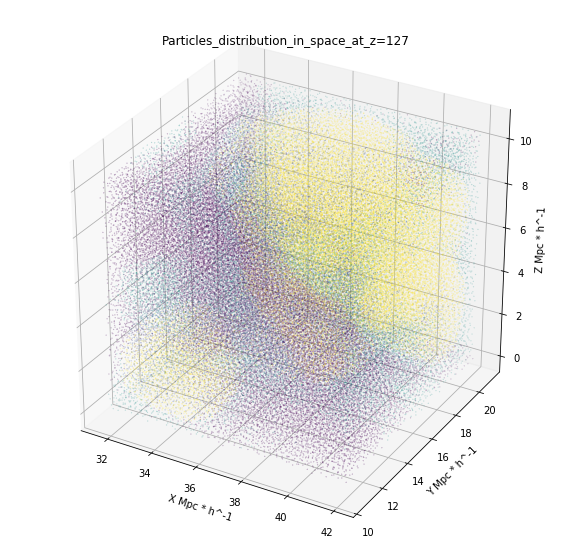

In [26]:
for i in range(10):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')

    # load some test data for demonstration and plotting
    title = 'Particles_distribution_in_space_at_z=127'
    ax.set_title(title)
    ax.scatter(box[i][:,0], box[i][:,1], box[i][:,2], s = 0.03, c= color[i] , cmap= 'viridis')
    ax.set_xlabel('X Mpc * h^-1')
    ax.set_ylabel('Y Mpc * h^-1')
    ax.set_zlabel('Z Mpc * h^-1')
    plt.show()

In [28]:
df = pd.DataFrame( all_boxes, columns = [ 'x', 'y', 'z', 'vx', 'vy', 'vz', 'id', 'noise_index', 'in_halo_real'])
print(df)

                  x          y          z          vx          vy          vz  \
0          0.079177   0.003392   0.416711    6.259036 -202.862370   43.663280   
1          0.289189   0.130278   0.456327    7.491590 -184.123080   35.697285   
2          0.262699   0.197281   0.224564   32.359110 -205.892180   91.230120   
3          0.240575   0.396040   0.038927   67.365524 -224.211120  142.792710   
4          0.408888   0.367119   0.182086  -14.317771 -216.648200  106.450930   
...             ...        ...        ...         ...         ...         ...   
19682993  62.496760  54.608433  56.375060 -127.488490  113.987370  -62.345690   
19682994  62.499400  54.338500  56.410940 -108.219795  102.061676  -57.551403   
19682995  62.498955  53.959934  55.001926  -82.908980  105.775240   71.743350   
19682996  62.492580  53.825770  55.482480  -85.098940  103.491110   23.930317   
19682997  62.489296  52.791428  56.275340  -80.765930  233.992770  -30.105589   

                  id  noise

In [29]:
df.to_csv(r'C:\Users\Saba\Documents\ML project\Full_particle_Data\particles_full_noise_1.66_1600.csv' , sep = ',' , encoding='utf-8', index=False)
print('Data made')

Data made


In [30]:
features = pd.read_csv(r'C:\Users\Saba\Documents\ML project\Full_particle_Data\Features60(δ).csv')
features.info()
features.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 14 columns):
id            60000 non-null float64
In_halo       60000 non-null float64
den_rc=0.8    60000 non-null float64
den_rc=1.2    60000 non-null float64
den_rc=1.6    60000 non-null float64
den_rc=2      60000 non-null float64
den_rc=2.4    60000 non-null float64
den_rc=2.8    60000 non-null float64
den_rc=3.2    60000 non-null float64
den_rc=3.6    60000 non-null float64
den_rc=4      60000 non-null float64
den_rc=4.4    60000 non-null float64
den_rc=4.8    60000 non-null float64
v^2           60000 non-null float64
dtypes: float64(14)
memory usage: 6.4 MB


,id,In_halo,den_rc=0.8,den_rc=1.2,den_rc=1.6,den_rc=2,den_rc=2.4,den_rc=2.8,den_rc=3.2,den_rc=3.6,den_rc=4,den_rc=4.4,den_rc=4.8,v^2
count,6.000000e+04,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000
mean,9.372267e+06,0.476017,0.005677,0.005859,0.005295,0.004678,0.004135,0.003656,0.003237,0.002867,0.002559,0.002297,0.002077,0.172864
std,5.644118e+06,0.499429,0.030297,0.023206,0.019581,0.017042,0.015110,0.013578,0.012325,0.011272,0.010380,0.009620,0.008964,0.129865
min,1.940170e+05,0.000000,-0.112729,-0.084802,-0.074497,-0.062945,-0.054744,-0.048694,-0.043221,-0.039673,-0.036272,-0.033569,-0.031289,0.000072
25%,4.014925e+06,0.000000,-0.015825,-0.009432,-0.007876,-0.006741,-0.005843,-0.005257,-0.004895,-0.004448,-0.004124,-0.003828,-0.003670,0.075292
50%,8.866210e+06,0.000000,0.005372,0.006718,0.006129,0.005469,0.004924,0.004419,0.003953,0.003461,0.002998,0.002578,0.002260,0.140793
75%,1.455314e+07,1.000000,0.026570,0.021971,0.018999,0.016904,0.014793,0.013247,0.011949,0.010839,0.009999,0.009240,0.008597,0.238242
max,1.948887e+07,1.000000,0.132558,0.094649,0.073129,0.060704,0.053824,0.046726,0.042799,0.039684,0.037181,0.033193,0.030131,1.000000


In [31]:
com = pd.DataFrame(components, columns = ['x','y','z'])
print(com)
df.to_csv(r'C:\Users\Saba\Documents\ML project\Full_particle_Data\CM_positions_1.66.csv' , sep = ',' , encoding='utf-8', index=False)
print('finished')

                x          y          z
0        1.781474   1.686880   1.659606
1        1.533432   1.983102   1.699702
2        1.706763   2.215069   1.749177
3        1.693397   2.589154   1.775836
4        1.600920   2.541585   1.475794
...           ...        ...        ...
382612  60.125736  56.825090  54.599300
382613  59.948420  56.677380  54.498140
382614  59.698368  57.109634  54.714397
382615  59.670364  56.782210  54.711470
382616  59.435710  56.848390  54.726017

[382617 rows x 3 columns]
finished
